

<img src="images/ProjectPythia_Logo_Final-01-Blue.svg" width=250 alt="Project Pythia Logo"></img>

# Time series analysis of ABI imagery data
## Filenames from AWS archives

### There are many [data products](https://docs.opendata.aws/noaa-goes16/cics-readme.html) with obscure filenames


---

# Overview

We want to take time differences of all the images with an hour, in one channel (C08, a water vapor emission channel). These differences expose internal gravity waves in clear air, but must be masked for high cloud.

------
# Initial imports of libraries 

In [106]:
# To stop extraneous warning messages from clogging the notebook output, 
# import the warnings module and set it to ignore all warnings.
import warnings
warnings.filterwarnings('ignore')

import requests
import os
from datetime import datetime
from glob import glob  # file handling

# Scene is a representation of satellite data 
from satpy.scene import Scene
# enable detailed debug logging in Satpy. 
from satpy.utils import debug_on

import matplotlib.pyplot as plt
import xarray as xr 

# Read a time series into a Satpy MultiScene object 

1. How can we obtain the necessary set of filenames? Filenames are hard to guess in the AWS archive, so we must execute a list 'ls' command there and select from the returned text list. 

In [36]:
# If you don't have Command Line Interface installed, do it here 

#!pip install awscli 

In [105]:
crop = 'RadC/'
year = '2023/'
jday = '256/'
hour = '15/'              # 15 UTC hour
grepstring = ' | grep C08'  # show only channel 8

URLpath = 'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-' + crop+year+jday+hour
LSpath = 's3://noaa-goes16/ABI-L1b-' + crop+year+jday+hour

getlist = 'aws s3 ls --no-sign-request ' + LSpath + grepstring
getlist

'aws s3 ls --no-sign-request s3://noaa-goes16/ABI-L1b-RadC/2023/256/15/ | grep C08'

In [38]:
import os
os.system(getlist)

2023-09-13 09:04:21    2864381 OR_ABI-L1b-RadC-M6C08_G16_s20232561501173_e20232561503546_c20232561504037.nc
2023-09-13 09:09:09    2864184 OR_ABI-L1b-RadC-M6C08_G16_s20232561506173_e20232561508546_c20232561509001.nc
2023-09-13 09:14:20    2864026 OR_ABI-L1b-RadC-M6C08_G16_s20232561511173_e20232561513546_c20232561514000.nc
2023-09-13 09:19:07    2863191 OR_ABI-L1b-RadC-M6C08_G16_s20232561516173_e20232561518546_c20232561518591.nc
2023-09-13 09:24:20    2865742 OR_ABI-L1b-RadC-M6C08_G16_s20232561521173_e20232561523546_c20232561523596.nc
2023-09-13 09:29:08    2863927 OR_ABI-L1b-RadC-M6C08_G16_s20232561526173_e20232561528546_c20232561528595.nc
2023-09-13 09:34:20    2862147 OR_ABI-L1b-RadC-M6C08_G16_s20232561531173_e20232561533546_c20232561533597.nc
2023-09-13 09:39:24    2863149 OR_ABI-L1b-RadC-M6C08_G16_s20232561536173_e20232561538546_c20232561538598.nc
2023-09-13 09:44:17    2863228 OR_ABI-L1b-RadC-M6C08_G16_s20232561541173_e20232561543546_c20232561543580.nc
2023-09-13 09:49:27    28655

0

In [40]:
# !aws s3 ls --no-sign-request s3://noaa-goes16/ABI-L1b-RadC/2023/256/15/ | grep C08

In [ ]:
# Manually put those into a list of files 

urls2dwn = [ 
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561501173_\
e20232561503546_c20232561504037.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561506173_e\
20232561508546_c20232561509001.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561511173_e\
20232561513546_c20232561514000.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561516173_e\
20232561518546_c20232561518591.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561521173_e\
20232561523546_c20232561523596.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561526173_e\
20232561528546_c20232561528595.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561531173_e\
20232561533546_c20232561533597.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561536173_e\
20232561538546_c20232561538598.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561541173_e\
20232561543546_c20232561543580.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561546173_e\
20232561548546_c20232561549035.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561551173_e\
20232561553546_c20232561554030.nc',
'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2023/256/15/OR_ABI-L1b-RadC-M6C08_G16_s20232561556173_e\
20232561558546_c20232561559012.nc']

--------
# Next, download those data files
### No need to repeat this step more than once 

Key parts of filename **OR_ABI-L1b-RadF-M6C01_G16** : 

Full disk radiances **RadF** or CONUS **RadC**, channel **C01** from GOES **G16** satellite. 

Time stamps are YYYYjjjhhmm where *jjj* is Julian day of year

In [42]:
local_directory = 'Downloaded_data/ABI-L1b-RadC/Channel8'

# Create your directory for data 
os.makedirs(local_directory, exist_ok=True)

# Iterate through the URLs and download files to local directory

for urld in urls2dwn:
    # Extract the filename from the URL.
    ntw = urld.split('/')[-1]
    
    # Construct the complete path to save the file in the local directory.
    file_path = os.path.join(local_directory, ntw)
    
    # Send an HTTP GET request to the URL.
    resp = requests.get(urld)
    
    # Check if the response is successful (status code 200).
    if resp.status_code == 200:
    # Write the content to the file in binary mode.
        with open(file_path, "wb") as file:
            file.write(resp.content)
        print(f"File '{ntw}' downloaded and saved to '{local_directory}'.")
    else:
        print(f"Failed to download '{ntw}' from the URL: {urld}")

File 'OR_ABI-L1b-RadC-M6C08_G16_s20232561501173_e20232561503546_c20232561504037.nc' downloaded and saved to 'Downloaded_data/ABI-L1b-RadC/Channel8'.
File 'OR_ABI-L1b-RadC-M6C08_G16_s20232561506173_e20232561508546_c20232561509001.nc' downloaded and saved to 'Downloaded_data/ABI-L1b-RadC/Channel8'.
File 'OR_ABI-L1b-RadC-M6C08_G16_s20232561511173_e20232561513546_c20232561514000.nc' downloaded and saved to 'Downloaded_data/ABI-L1b-RadC/Channel8'.
File 'OR_ABI-L1b-RadC-M6C08_G16_s20232561516173_e20232561518546_c20232561518591.nc' downloaded and saved to 'Downloaded_data/ABI-L1b-RadC/Channel8'.
File 'OR_ABI-L1b-RadC-M6C08_G16_s20232561521173_e20232561523546_c20232561523596.nc' downloaded and saved to 'Downloaded_data/ABI-L1b-RadC/Channel8'.
File 'OR_ABI-L1b-RadC-M6C08_G16_s20232561526173_e20232561528546_c20232561528595.nc' downloaded and saved to 'Downloaded_data/ABI-L1b-RadC/Channel8'.
File 'OR_ABI-L1b-RadC-M6C08_G16_s20232561531173_e20232561533546_c20232561533597.nc' downloaded and saved t

--------
# Create satpy MultiScene timeseries object

In [107]:
sat_files = glob(local_directory+'/*')
sat_files.sort()
sat_files

['Downloaded_data/ABI-L1b-RadC/Channel8/OR_ABI-L1b-RadC-M6C08_G16_s20232561501173_e20232561503546_c20232561504037.nc',
 'Downloaded_data/ABI-L1b-RadC/Channel8/OR_ABI-L1b-RadC-M6C08_G16_s20232561506173_e20232561508546_c20232561509001.nc',
 'Downloaded_data/ABI-L1b-RadC/Channel8/OR_ABI-L1b-RadC-M6C08_G16_s20232561511173_e20232561513546_c20232561514000.nc',
 'Downloaded_data/ABI-L1b-RadC/Channel8/OR_ABI-L1b-RadC-M6C08_G16_s20232561516173_e20232561518546_c20232561518591.nc',
 'Downloaded_data/ABI-L1b-RadC/Channel8/OR_ABI-L1b-RadC-M6C08_G16_s20232561521173_e20232561523546_c20232561523596.nc',
 'Downloaded_data/ABI-L1b-RadC/Channel8/OR_ABI-L1b-RadC-M6C08_G16_s20232561526173_e20232561528546_c20232561528595.nc',
 'Downloaded_data/ABI-L1b-RadC/Channel8/OR_ABI-L1b-RadC-M6C08_G16_s20232561531173_e20232561533546_c20232561533597.nc',
 'Downloaded_data/ABI-L1b-RadC/Channel8/OR_ABI-L1b-RadC-M6C08_G16_s20232561536173_e20232561538546_c20232561538598.nc',
 'Downloaded_data/ABI-L1b-RadC/Channel8/OR_ABI-L

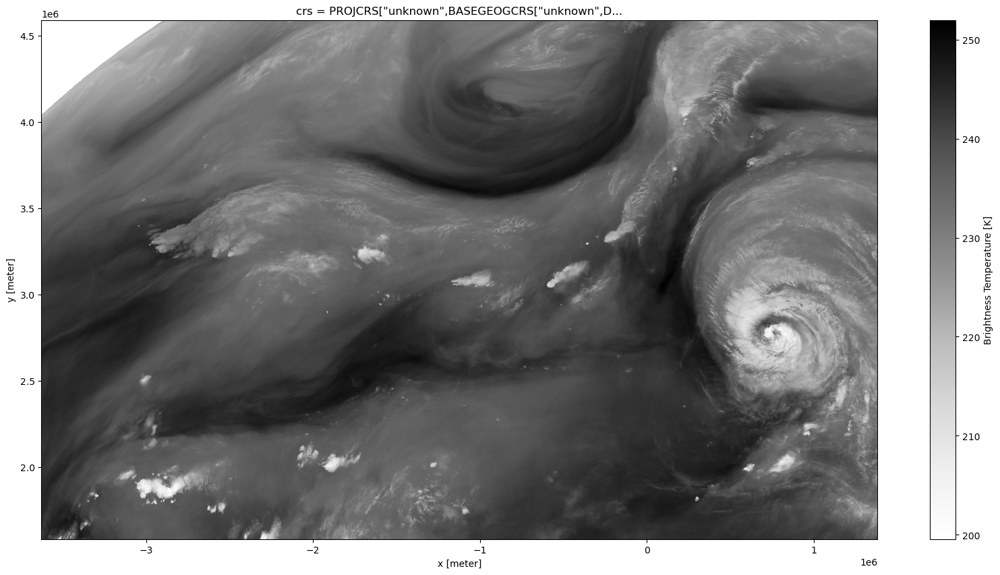

In [108]:
from satpy import MultiScene
from satpy.multiscene import timeseries

mscn = MultiScene.from_files(sat_files, reader='abi_l1b')
mscn.load(['C08'])
blended = mscn.blend(blend_function=timeseries)

# Quick plot of time 0 
blended['C08'][0].plot( cmap='Greys', size=10,aspect=2);

<xarray.DataArray 'Rad' (time: 11, y: 1500, x: 2500)>
dask.array<mul, shape=(11, 1500, 2500), dtype=float64, chunksize=(1, 1500, 2500), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 4.588e+06 4.586e+06 4.584e+06 ... 1.586e+06 1.584e+06
  * x        (x) float64 -3.626e+06 -3.624e+06 -3.622e+06 ... 1.38e+06 1.382e+06
  * time     (time) datetime64[ns] 2023-09-13T15:06:17.300000 ... 2023-09-13T...
    crs      object PROJCRS["unknown",BASEGEOGCRS["unknown",DATUM["unknown",E...

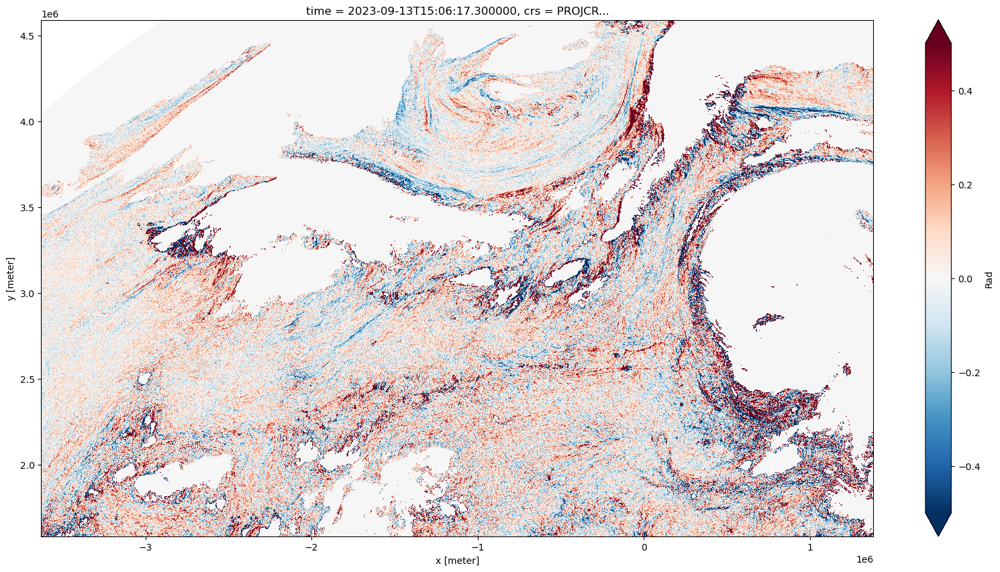

In [111]:
tdiffmask = blended['C08'].diff(dim='time') * (blended['C08'] >235)

# Quick plot of first time level 
tdiffmask[0].plot( vmin=-0.5, vmax=0.5, cmap='RdBu_r' , size=10,aspect=2);

tdiffmask

----------
# Now we want an animation 
Why is that so hard? 

Dozen lines or more, all the important stuff buried, slow as hell. 

Sigh. 

This looks good but must bring the data back up to SatPy from xarray which gave us the .diff(dim='time') step.

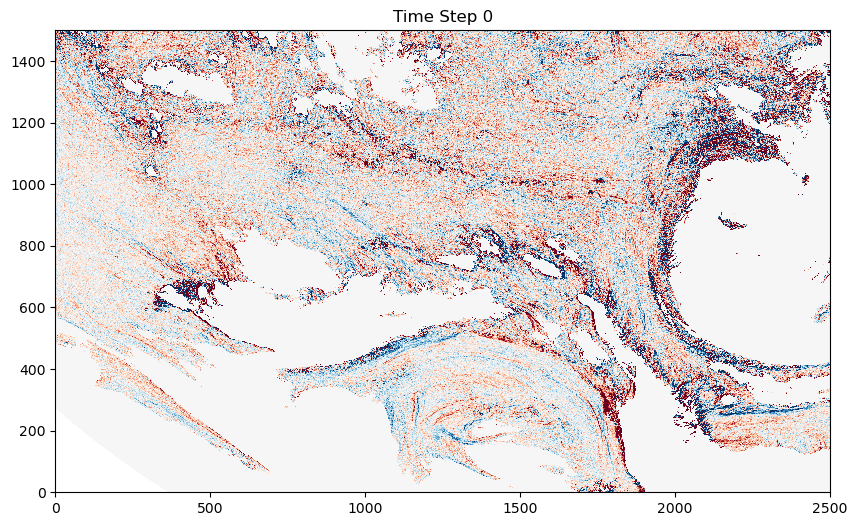

In [114]:
from IPython.display import HTML
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))  

# Function to initialize the animation 
def init():
    im = ax.pcolormesh(tdiffmask[0],vmin=-0.5,vmax=0.5,cmap='RdBu_r');
    plt.title(f'Time Step 0')
    return [im]

# Function to animate the frames
def animate(it):
    im = ax.pcolormesh(tdiffmask[it],vmin=-0.5,vmax=0.5,cmap='RdBu_r');
    plt.title(f'Time Step {it}')
    return [im]

# Create an animation
ani = animation.FuncAnimation(fig, animate, init_func=init, frames=10, repeat=True)

# Display the animation in the Jupyter Notebook
HTML(ani.to_jshtml())


## Last Section

If you're comfortable, and as we briefly used for our embedded logo up top, you can embed raw html into Jupyter Markdown cells (edit to see):

> [!NOTE]  
> Highlights information that users should take into account, even when skimming.

> [!TIP]
> Optional information to help a user be more successful.

> [!IMPORTANT]  
> Crucial information necessary for users to succeed.

> [!WARNING]  
> Critical content demanding immediate user attention due to potential risks.

> [!CAUTION]
> Negative potential consequences of an action.

<div class="admonition note">
<p class="admonition-title">Note</p>
<p>You should note that the title will be automatically capitalized.</p>
</div>

<div class="admonition alert alert-info">
    <p class="admonition-title" style="font-weight:bold">Info</p>
    Your relevant information here!
</div>

Feel free to copy this around and edit or play around with yourself. Some other `admonitions` you can put in:

<div class="admonition alert alert-success">
    <p class="admonition-title" style="font-weight:bold">Success</p>
    We got this done after all!
</div>

<div class="admonition alert alert-warning">
    <p class="admonition-title" style="font-weight:bold">Warning</p>
    Be careful!
</div>

<div class="admonition alert alert-danger">
    <p class="admonition-title" style="font-weight:bold">Danger</p>
    Scary stuff be here.
</div>

We also suggest checking out Jupyter Book's [brief demonstration](https://jupyterbook.org/content/metadata.html#jupyter-cell-tags) on adding cell tags to your cells in Jupyter Notebook, Lab, or manually. Using these cell tags can allow you to [customize](https://jupyterbook.org/interactive/hiding.html) how your code content is displayed and even [demonstrate errors](https://jupyterbook.org/content/execute.html#dealing-with-code-that-raises-errors) without altogether crashing our loyal army of machines!

---

## Summary
Add one final `---` marking the end of your body of content, and then conclude with a brief single paragraph summarizing at a high level the key pieces that were learned and how they tied to your objectives. Look to reiterate what the most important takeaways were.

### What's next?
Let Jupyter book tie this to the next (sequential) piece of content that people could move on to down below and in the sidebar. However, if this page uniquely enables your reader to tackle other nonsequential concepts throughout this book, or even external content, link to it here!

## Resources and references
Finally, be rigorous in your citations and references as necessary. Give credit where credit is due. Also, feel free to link to relevant external material, further reading, documentation, etc. Then you're done! Give yourself a quick review, a high five, and send us a pull request. A few final notes:
 - `Kernel > Restart Kernel and Run All Cells...` to confirm that your notebook will cleanly run from start to finish
 - `Kernel > Restart Kernel and Clear All Outputs...` before committing your notebook, our machines will do the heavy lifting
 - Take credit! Provide author contact information if you'd like; if so, consider adding information here at the bottom of your notebook
 - Give credit! Attribute appropriate authorship for referenced code, information, images, etc.
 - Only include what you're legally allowed: **no copyright infringement or plagiarism**
 
Thank you for your contribution!